In [1]:
load_from_config = True
raw_data_folder = ""
preprocessed_data_folder = ""

In [2]:
import yaml
import pandas as pd
import matplotlib.pyplot as plt
import random
import math
import numpy as np
from folium.plugins import MarkerCluster
import folium
import os
import osmnx as ox

In [3]:
with open('../config.yaml') as file:
  params= yaml.safe_load(file)

# in case of a automatic run
if not load_from_config:
    params['raw_data_folder'] = raw_data_folder
    params['preprocessed_data_folder'] = preprocessed_data_folder

preprocessed_data_folder = params['data_folder'] + params['preprocessed_data_folder']

In [4]:
df_tracks = pd.read_pickle(preprocessed_data_folder + 'pp_merged.pkl')
df_robots = pd.read_pickle(preprocessed_data_folder + 'pp_robot.pkl')
df_orientations = pd.read_pickle(preprocessed_data_folder + 'pp_orientations.pkl')

## Load Freiberg data

In [5]:
freiberg_dom = (50.920066988737176, 13.343304517215023)

In [6]:
# check if the graph is already downloaded
graph_file = params['data_folder'] + "preprocessed/" + 'freiberg_dom.gpkg'
if not os.path.exists(graph_file):

    G = ox.graph_from_point(freiberg_dom, dist=1000,
                            network_type="all_private", simplify=True)
    filtered_nodes = [node for node, degree in dict(
        G.degree()).items() if degree > 2]
    G_filtered = G.subgraph(filtered_nodes)

    ox.save_graphml(G_filtered, graph_file)
else: 
    G_filtered = ox.load_graphml(graph_file)

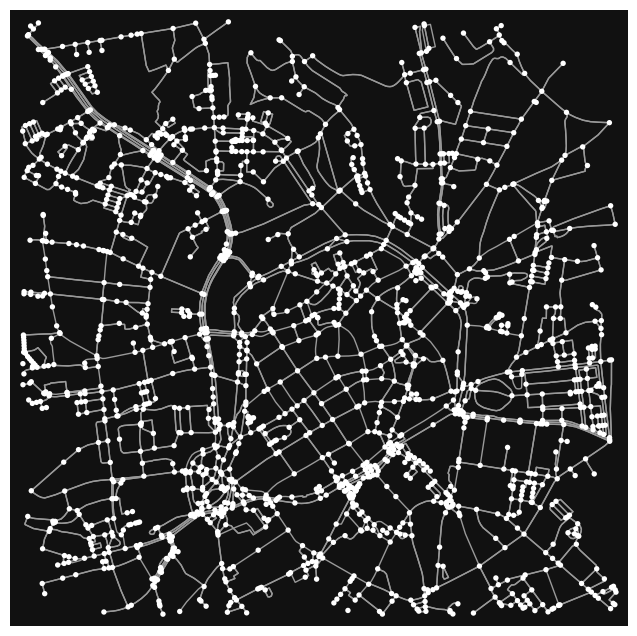

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [7]:
ox.plot_graph(G_filtered)

## Preparing analysis

In [8]:
# make sure to use the simplyfied graph that is filtered by degree > 2 for this!
#see cell above
def is_crossing(G, lat, lon, distance=10):
    _, dist = ox.nearest_nodes(G, lon, lat, return_dist=True)
    return dist

In [9]:
# apply the crossing check on lat lon in the robot dataframe
df_tracks["robot_crossing_dist"] = df_tracks.apply(
    lambda x: is_crossing(G_filtered, x["robot_latitude"], x["robot_longitude"]), axis=1)

df_tracks["robot_at_crossing"] = df_tracks["robot_crossing_dist"] < 8

df_tracks["human_crossing_dist"] = df_tracks.apply(
    lambda x: is_crossing(G_filtered, x["latitude_human"], x["longitude_human"]), axis=1)

df_tracks["human_at_crossing"] = df_tracks["human_crossing_dist"] < 8

In [10]:
df_tracks.groupby(["robot_at_crossing", "human_at_crossing"])["obj.time"].count().unstack()

human_at_crossing,False,True
robot_at_crossing,,
False,3585,510
True,582,1243


## Determine distance parameters

In [11]:
if False:
    df_robots["crossing_dist"] = df_robots.apply(
    lambda x: is_crossing(G_filtered, x["latitude"], x["longitude"]), axis=1)

    df_robots["crossing_dist"].value_counts()

In [12]:
for index, row in df_orientations.iterrows():
    id = row["obj.label_id_unique"]
    
    # Statistics for the distances
    aux = df_tracks[(df_tracks["obj.label_id_unique"] == id)]
    df_orientations.at[index, "robot_crossing_dist_mean"] = aux.robot_crossing_dist.mean()
    df_orientations.at[index, "human_crossing_dist_mean"] = aux.human_crossing_dist.mean()
    df_orientations.at[index, "robot_crossing_dist_min"]  = aux.robot_crossing_dist.min()
    df_orientations.at[index, "human_crossing_dist_min"]  = aux.human_crossing_dist.min()
    df_orientations.at[index, "robot_crossing_dist_max"]  = aux.robot_crossing_dist.max()
    df_orientations.at[index, "human_crossing_dist_max"]  = aux.human_crossing_dist.max()
    
    # Categorization for the distances
    samples = row["sample_count"]
    
    crossing_count_humans = df_tracks[(df_tracks["obj.label_id_unique"] == id) & 
                                      (df_tracks["human_at_crossing"] == True)].shape[0]
    if crossing_count_humans > 0:
        ratio = crossing_count_humans / samples
    else:
        ratio = 0
    df_orientations.at[index, "human_crossing_ratio"] = ratio

    crossing_count_humans = df_tracks[(df_tracks["obj.label_id_unique"] == id) & 
                                      (df_tracks["robot_at_crossing"] == True)].shape[0]
    if crossing_count_humans > 0:
        ratio = crossing_count_humans / samples
    else:
        ratio = 0
    df_orientations.at[index, "robot_crossing_ratio"] = ratio

<Axes: xlabel='human_crossing_ratio', ylabel='robot_crossing_ratio'>

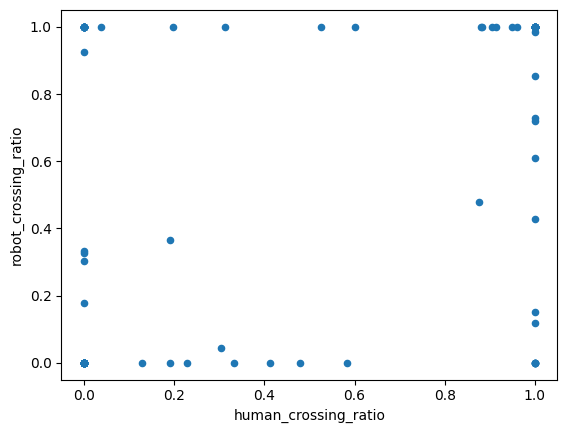

In [13]:
df_orientations.plot.scatter(x="human_crossing_ratio", y="robot_crossing_ratio")

In [14]:
df_orientations['context'] = "uncertain"
#df_orientations.loc[(df_orientations['human_crossing_ratio'] > 0.9) & 
#                    (df_orientations['robot_crossing_ratio'] > 0.9), 'context'] = "junction"
#
#df_orientations.loc[(df_orientations['human_crossing_ratio'] < 0.1) & 
#                    (df_orientations['robot_crossing_ratio'] < 0.1), 'context'] = "non-junction"

df_orientations.loc[(df_orientations['human_crossing_ratio'] > 0.9), 'context'] = "junction"

df_orientations.loc[(df_orientations['human_crossing_ratio'] < 0.1), 'context'] = "non-junction"

df_orientations['context'] = df_orientations['context'].astype('category')

In [15]:
df_orientations['context'] = df_orientations['context'].astype('category')
df_orientations['context'].value_counts()

context
non-junction    84
junction        39
uncertain       16
Name: count, dtype: int64

# Extract pedestrian count

In [16]:
pd.to_pickle(df_orientations, preprocessed_data_folder + params['preprocessed_file_labels']+ "orientations.pkl")

## Testing

In [17]:
run = preprocessed_data_folder.split("/")[-2]

In [18]:
import matplotlib.colors as mcolors
from folium.features import DivIcon
import branca.colormap as cm

linear = cm.LinearColormap(['green','yellow','red'], vmin=0., vmax=1.)

center = [df_tracks['robot_latitude'].mean(), df_tracks['robot_longitude'].mean()]

mymap = folium.Map(location=center, zoom_start=18, max_zoom=22, max_native_zoom=18, attr='osm.com')

for id in df_tracks['obj.label_id_unique'].unique():
    if id >19999: #!= track:
        continue
    df = df_tracks[df_tracks['obj.label_id_unique'] == id]
    aux = df[df['pose_valid']==True]

    if aux.shape[0] > 0:

        for index, row in aux.iterrows():
            color = linear(df_orientations[df_orientations['obj.label_id_unique'] == id].iloc[0].robot_crossing_ratio)
            folium.CircleMarker([row['robot_latitude'], row['robot_longitude']],
                                radius=2,
                                color='gray').add_to(mymap)
            
            color = linear(df_orientations[df_orientations['obj.label_id_unique'] == id].iloc[0].human_crossing_ratio)
            folium.CircleMarker([row['latitude_human'], row['longitude_human']],
                                    radius=2,
                                    color = color).add_to(mymap)
            
            if row['valid_track'] == True:
                link_color = 'blue'
            else:
                link_color = 'red'
            folium.PolyLine(locations=[[row['robot_latitude'], row['robot_longitude']],
                                       [row['latitude_human'], row['longitude_human']]], 
                                       weight=0.5, color=link_color).add_to(mymap)
                
# Karte anzeigen
mymap.save(preprocessed_data_folder + run + 'map.html')
mymap

In [19]:
df_tracks.columns

Index(['obj.time', 'obj.confidence', 'obj.label', 'obj.position_covariance.0',
       'obj.position_covariance.1', 'obj.position_covariance.2',
       'obj.position_covariance.3', 'obj.position_covariance.4',
       'obj.position_covariance.5', 'obj.tracking_state', 'obj.velocity.0',
       'obj.velocity.1', 'obj.velocity.2', 'gnss.latitude', 'gnss.longitude',
       'gnss.timestamp', 'gnss.time', 'obj.frame', 'obj.label_id_unique',
       'obj.timestamp', 'obj.human_pos.x_sensor', 'obj.human_pos.y_sensor',
       'obj.human_pos.x_robot', 'obj.human_pos.y_robot', 'obj.human_speed',
       'distance_robot', 'angle_robot', 'valid_track', 'obj.cov_area',
       'obj.cov_angle', 'obj.cov_width', 'obj.cov_heigth', 'color',
       'timestamp_gnss', 'robot_before', 'robot_after', 'valid_interpolation',
       'robot_latitude', 'robot_longitude', 'bearing', 'robot_latitude_before',
       'robot_longitude_before', 'robot_latitude_after',
       'robot_longitude_after', 'pose_valid', 'speed', '

In [20]:
df_tracks.groupby('obj.frame')['obj.label_id_unique'].nunique()

obj.frame
front    90
left      2
right    47
Name: obj.label_id_unique, dtype: int64